## Question 1

### Part (a)

In [66]:
import re
import matplotlib.pyplot as plt

# read txt file
f = open('/Users/althealam/Desktop/School/2026Spring/CS 5740-Natural Processing Language/CS-5740---Natural-Language-Processing/HW0/Data/rawtext.txt')
lines = f.readlines()

# define sentence tokenizer
def sentence_tokenizer(text):
    sentences = re.findall(r'[^.!?]*[.!?]', text)
    return [s.strip() for s in sentences if s.strip()]


all_sentences = []
sentence_count_per_paragraph = []
# iterate txt file
for line in lines:
    split_line = sentence_tokenizer(line)
    all_sentences.extend(split_line)
    sentence_count_per_paragraph.append(len([x for x in split_line if x!='']))
print(all_sentences)
print(sentence_count_per_paragraph)

avg_sentence_length = len(all_sentences)/len(lines)
print("The average number of sentences per paragraph is:", avg_sentence_length)

['leonard shenoff randle (born february 12, 1949) is a former major league baseball player.', 'he was the first-round pick of the washington senators in the secondary phase of the june 1970 major league baseball draft, tenth overall.', 'philippe adnot (born 25 august 1945 in rhèges) is a member of the senate of france.', 'he was first elected in 1989, and represents the aube department.', 'a farmer by profession, he serves as an independent, and also serves as the head of the general council of aube, to which he was elected to represent the canton of méry-sur-seine in 1980.', 'in 1998 and 2008, he was re-elected to the senate in the first round, avoiding the need for a run-off vote.', 'having contributed to the creation of the university of technology of troyes, in 1998 he was made the first vice president of the university board, of which he is currently the president.', "he is a member of the senate's committee on the laws relating to the freedoms and responsibilities of universities

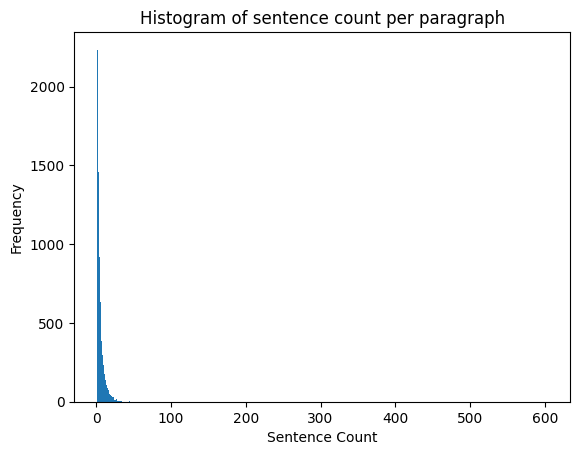

In [67]:
plt.hist(sentence_count_per_paragraph, bins = range(1, max(sentence_count_per_paragraph)+1))

plt.title('Histogram of sentence count per paragraph')
plt.xlabel('Sentence Count')
plt.ylabel('Frequency')

plt.show()


### Part (b)

We can note that, if a sentence is like "dr. smith was born in 1950", this sentence is not end with .. Hence if we use ".!?" as the end signal, it will split the sentences wrong

### Part (c)

In [68]:
# test for nltk
import nltk

nltk.download('punkt_tab')
paragraph = 'x and y went to the market . they bought eggs and breads'

sentences = nltk.sent_tokenize(paragraph)

print(sentences)

['x and y went to the market .', 'they bought eggs and breads']


[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/althealam/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [69]:
all_sentences_nltk = []

for line in lines:
    sentences = nltk.sent_tokenize(line)
    all_sentences_nltk.extend(sentences)

print(all_sentences_nltk)

['leonard shenoff randle (born february 12, 1949) is a former major league baseball player.', 'he was the first-round pick of the washington senators in the secondary phase of the june 1970 major league baseball draft, tenth overall.', 'philippe adnot (born 25 august 1945 in rhèges) is a member of the senate of france.', 'he was first elected in 1989, and represents the aube department.', 'a farmer by profession, he serves as an independent, and also serves as the head of the general council of aube, to which he was elected to represent the canton of méry-sur-seine in 1980. in 1998 and 2008, he was re-elected to the senate in the first round, avoiding the need for a run-off vote.', 'having contributed to the creation of the university of technology of troyes, in 1998 he was made the first vice president of the university board, of which he is currently the president.', "he is a member of the senate's committee on the laws relating to the freedoms and responsibilities of universities.",

In [70]:
for i in range(len(all_sentences_nltk)):
    if all_sentences_nltk[i] != all_sentences[i]:
        print(f"Sentence {i}")
        print("My tokenizer:",all_sentences[i])
        print("nltk tokenizer:", all_sentences_nltk[i])
    
    if i==10:
        break

Sentence 4
My tokenizer: a farmer by profession, he serves as an independent, and also serves as the head of the general council of aube, to which he was elected to represent the canton of méry-sur-seine in 1980.
nltk tokenizer: a farmer by profession, he serves as an independent, and also serves as the head of the general council of aube, to which he was elected to represent the canton of méry-sur-seine in 1980. in 1998 and 2008, he was re-elected to the senate in the first round, avoiding the need for a run-off vote.
Sentence 5
My tokenizer: in 1998 and 2008, he was re-elected to the senate in the first round, avoiding the need for a run-off vote.
nltk tokenizer: having contributed to the creation of the university of technology of troyes, in 1998 he was made the first vice president of the university board, of which he is currently the president.
Sentence 6
My tokenizer: having contributed to the creation of the university of technology of troyes, in 1998 he was made the first vice 

1. Different tokenized sentences: in the sentence 4<br>
* My tokenizer: a farmer by profession, he serves as an independent, and also serves as the head of the general council of aube, to which he was elected to represent the canton of méry-sur-seine in 1980.
* nltk tokenzier: a farmer by profession, he serves as an independent, and also serves as the head of the general council of aube, to which he was elected to represent the canton of méry-sur-seine in 1980. in 1998 and 2008, he was re-elected to the senate in the first round, avoiding the need for a run-off vote.<br>

2. Reason<br>
* My tokenizer will split the sentences if it meet the signal '.!?'
* But, nltk tokenzier will consider other aspects: what is it before or after the signal

## Question 2